**Machine Learning Explainability**

Extract human-understandable insights from any machine learning model.

**Use Cases for Model Insights**

Why and when do you need insights?

2
**Permutation Importance**

**What features does your model think are important?**

3
**Partial Plots**

How does each feature affect your predictions?

4
**SHAP Values**

Understand individual predictions

5
**Advanced Uses of SHAP Values**
Aggregate SHAP values for even more detailed model insights

The Income Prediction problem associated with the Adult Income Census dataset. The goal is to accurately predict whether or not someone is making more or less than $50,000 a year. 

In [6]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from collections import Counter

from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, ExtraTreesClassifier, VotingClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, learning_curve, train_test_split, KFold
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings('ignore')

sns.set(style='white', context='notebook', palette='deep')

In [8]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:75% !important; }</style>"))

In [0]:
dataset= pd.read_csv("/content/gdrive/My Drive/ML Projects/Interpretable ML/adult.csv")

In [248]:
print("Number of rows in data =",dataset.shape[0])
print("Number of columns in data =",dataset.shape[1])
print("\n")
print("**Sample data:**")
dataset.head(5)

Number of rows in data = 32561
Number of columns in data = 15


**Sample data:**


,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


In [249]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education.num   32561 non-null  int64 
 5   marital.status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital.gain    32561 non-null  int64 
 11  capital.loss    32561 non-null  int64 
 12  hours.per.week  32561 non-null  int64 
 13  native.country  32561 non-null  object
 14  income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [250]:
# Removing any space in the names of the columns
dataset.columns = dataset.columns.str.replace(' ', '')
dataset.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'education.num',
       'marital.status', 'occupation', 'relationship', 'race', 'sex',
       'capital.gain', 'capital.loss', 'hours.per.week', 'native.country',
       'income'],
      dtype='object')

In [252]:
dataset['income'].value_counts()

<=50K    24720
>50K      7841
Name: income, dtype: int64

In [253]:
dataset['age'].nunique()

73

In [254]:
dataset['workclass'].unique()

array(['?', 'Private', 'State-gov', 'Federal-gov', 'Self-emp-not-inc',
       'Self-emp-inc', 'Local-gov', 'Without-pay', 'Never-worked'],
      dtype=object)

In [255]:
# This Code will Count the occuring of the '?' in all the columns
for i in dataset.columns:
    t = dataset[i].value_counts()
    index = list(t.index)
    print ("The Value Counts of ? in", i)
    for i in index:
        temp = 0
        if i == '?':
            print (t['?'])
            temp = 1
            break
    if temp == 0:
        print ("0")

The Value Counts of ? in age
0
The Value Counts of ? in workclass
1836
The Value Counts of ? in fnlwgt
0
The Value Counts of ? in education
0
The Value Counts of ? in education.num
0
The Value Counts of ? in marital.status
0
The Value Counts of ? in occupation
1843
The Value Counts of ? in relationship
0
The Value Counts of ? in race
0
The Value Counts of ? in sex
0
The Value Counts of ? in capital.gain
0
The Value Counts of ? in capital.loss
0
The Value Counts of ? in hours.per.week
0
The Value Counts of ? in native.country
583
The Value Counts of ? in income
0


In [0]:
dataset[dataset == '?'] = np.nan

In [257]:
# Dropping the rows whose occupation is '?' 
dataset = dataset[dataset.occupation != '?']

dataset['occupation'].value_counts()

Prof-specialty       4140
Craft-repair         4099
Exec-managerial      4066
Adm-clerical         3770
Sales                3650
Other-service        3295
Machine-op-inspct    2002
Transport-moving     1597
Handlers-cleaners    1370
Farming-fishing       994
Tech-support          928
Protective-serv       649
Priv-house-serv       149
Armed-Forces            9
Name: occupation, dtype: int64

In [258]:
# The minimum age of the person
dataset.at[dataset['age'].idxmin(),'age']

17

In [0]:
for col in ['workclass', 'occupation', 'native.country']:
    dataset[col].fillna(dataset[col].mode()[0], inplace=True)

In [260]:
dataset.isnull().sum()

age               0
workclass         0
fnlwgt            0
education         0
education.num     0
marital.status    0
occupation        0
relationship      0
race              0
sex               0
capital.gain      0
capital.loss      0
hours.per.week    0
native.country    0
income            0
dtype: int64

In [246]:
# Reformat Column We Are Predicting

#dataset['income']=dataset['income'].map({'<=50K': 0, '>50K': 1, '<=50K.': 0, '>50K.': 1})
#dataset.head(4)

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,Private,77053,HS-grad,9,Widowed,Prof-specialty,Not-in-family,White,Female,0,4356,40,United-States,0
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,0
2,66,Private,186061,Some-college,10,Widowed,Prof-specialty,Unmarried,Black,Female,0,4356,40,United-States,0
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,0


In [0]:
# Changing the income column into Numerical Value
dataset['income'] = dataset['income'].map({'<=50K':0, '>50K':1})

In [96]:
# Changing the Categorical Values to Numerical values using the Label Encoder
from sklearn.preprocessing import LabelEncoder

categorical_features = list(dataset.select_dtypes(include=['object']).columns)
label_encoder_feat = {}
for i, feature in enumerate(categorical_features):
    label_encoder_feat[feature] = LabelEncoder()
    dataset[feature] = label_encoder_feat[feature].fit_transform(dataset[feature])

dataset.head(3)

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,3,77053,11,9,6,9,1,4,0,0,4356,40,38,0
1,82,3,132870,11,9,6,3,1,4,0,0,4356,18,38,0
2,66,3,186061,15,10,6,9,4,2,0,0,4356,40,38,0


In [0]:
# Identify Numeric features
numeric_features = ['age','fnlwgt','education.num','capital.gain','capital.loss','hours.per.week','income']

# Identify Categorical features
cat_features = ['workclass','education','marital.status', 'occupation', 'relationship', 'race', 'sex', 'native']

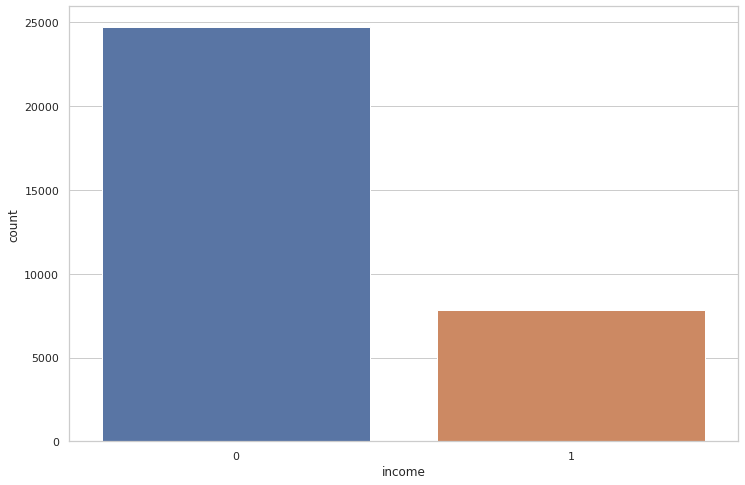

In [263]:
# Count of >50K & <=50K
sns.countplot(dataset['income'],label="Count")

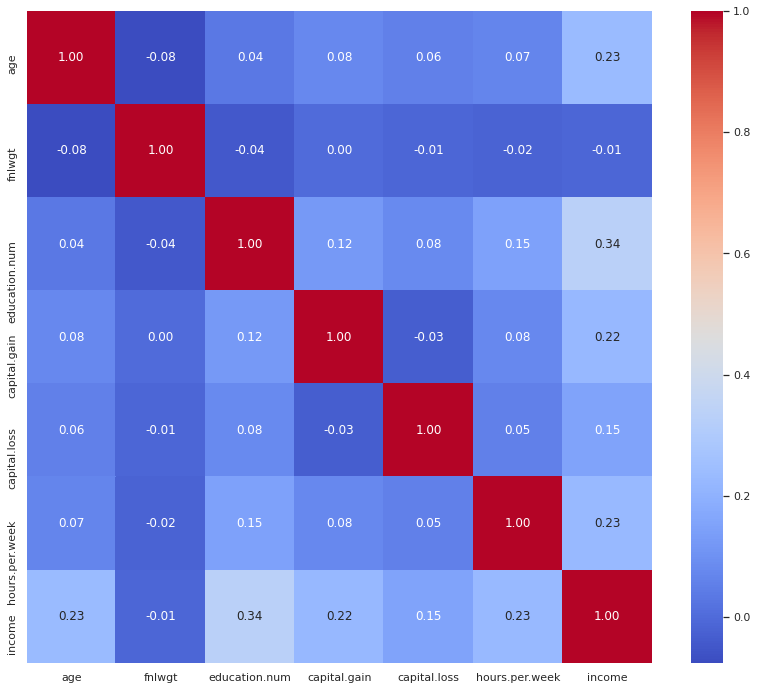

In [150]:
# Correlation matrix between numerical values
g = sns.heatmap(dataset[numeric_features].corr(),annot=True, fmt = ".2f", cmap = "coolwarm")

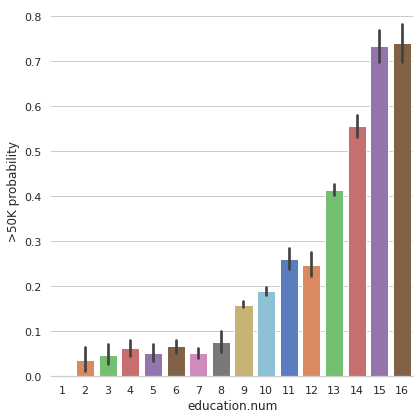

In [264]:
# Explore Education Num vs Income
g = sns.factorplot(x="education.num",y="income",data=dataset,kind="bar",size = 6,palette = "muted")
g.despine(left=True)
g = g.set_ylabels(">50K probability")

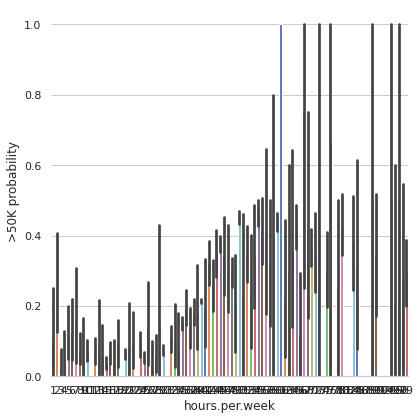

In [265]:
# Explore Hours Per Week vs Income
g  = sns.factorplot(x="hours.per.week",y="income",data=dataset,kind="bar",size = 6,palette = "muted")
g.despine(left=True)
g = g.set_ylabels(">50K probability")

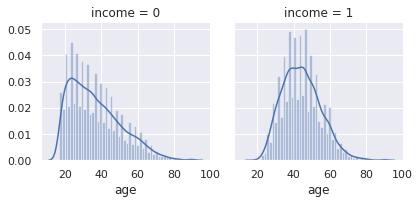

In [183]:
# Explore Age vs Income
g = sns.FacetGrid(dataset, col='income')
g = g.map(sns.distplot, "age")

**Categorical Data Analysis**

In [267]:
# Fill Missing Category Entries
dataset["workclass"] = dataset["workclass"].fillna("X")
dataset["occupation"] = dataset["occupation"].fillna("X")
dataset["native.country"] = dataset["native.country"].fillna("United-States")

# Confirm All Missing Data is Handled
dataset.isnull().sum()

age               0
workclass         0
fnlwgt            0
education         0
education.num     0
marital.status    0
occupation        0
relationship      0
race              0
sex               0
capital.gain      0
capital.loss      0
hours.per.week    0
native.country    0
income            0
dtype: int64

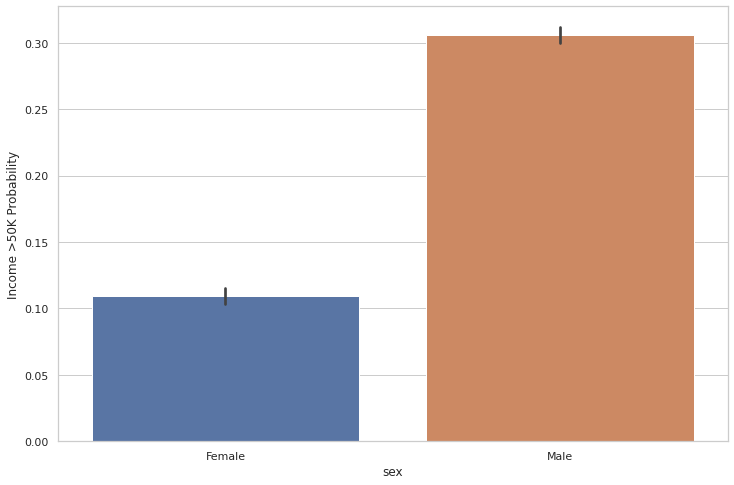

In [268]:
# Explore Sex vs Income
g = sns.barplot(x="sex",y="income",data=dataset)
g = g.set_ylabel("Income >50K Probability")

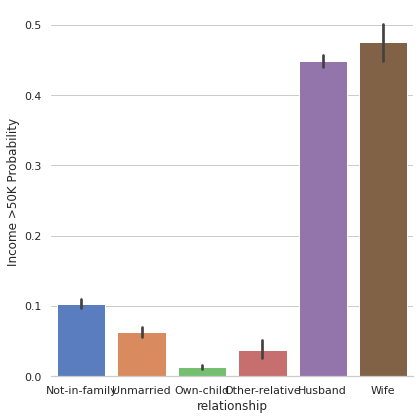

In [269]:
# Explore Relationship vs Income
g = sns.factorplot(x="relationship",y="income",data=dataset,kind="bar", size = 6 ,
palette = "muted")
g.despine(left=True)
g = g.set_ylabels("Income >50K Probability")

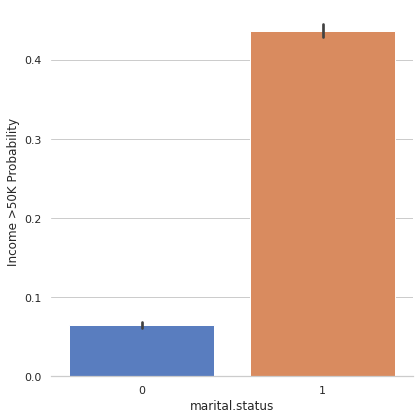

In [276]:
# Explore Marital Status vs Income
g = sns.factorplot(x="marital.status",y="income",data=dataset,kind="bar", size = 6 ,
palette = "muted")
g.despine(left=True)
g = g.set_ylabels("Income >50K Probability")

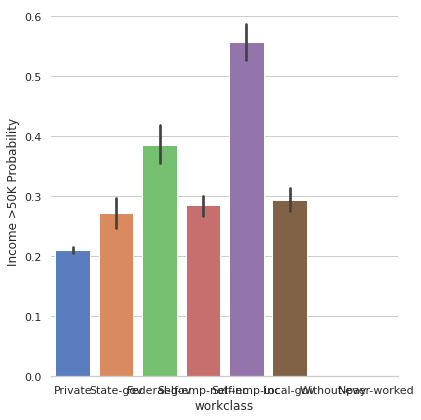

In [271]:
# Explore Workclass vs Income
g = sns.factorplot(x="workclass",y="income",data=dataset,kind="bar", size = 6 ,
palette = "muted")
g.despine(left=True)
g = g.set_ylabels("Income >50K Probability")

In [0]:
# Convert Sex value to 0 and 1
dataset["sex"] = dataset["sex"].map({"Male": 0, "Female":1})

In [273]:
dataset.head(3)

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,Private,77053,HS-grad,9,Widowed,Prof-specialty,Not-in-family,White,1,0,4356,40,United-States,0
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,1,0,4356,18,United-States,0
2,66,Private,186061,Some-college,10,Widowed,Prof-specialty,Unmarried,Black,1,0,4356,40,United-States,0


In [192]:
# Checking the Difference between the values of the mean and median to get an idea about the amount of outliers
print (dataset['hours.per.week'].median())
print (dataset['hours.per.week'].mean())

40.0
40.437455852092995


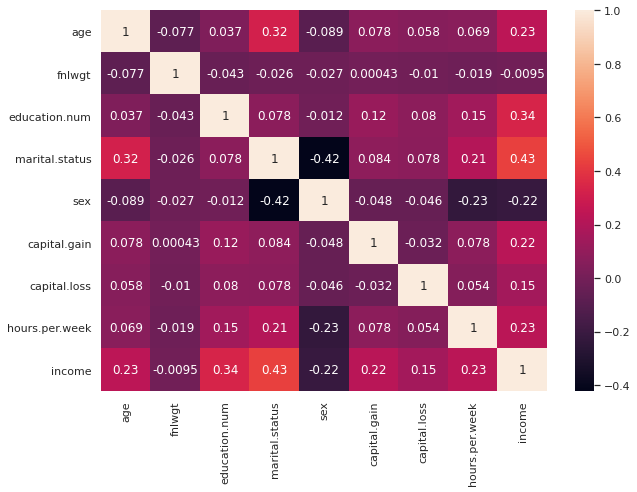

In [193]:
# This heatmap shows the Correlation between the different variables
plt.rcParams['figure.figsize'] = [10,7]
sns.heatmap(dataset.corr(), annot = True);

In [274]:
dataset['occupation'].unique()

array(['Prof-specialty', 'Exec-managerial', 'Machine-op-inspct',
       'Other-service', 'Adm-clerical', 'Craft-repair',
       'Transport-moving', 'Handlers-cleaners', 'Sales',
       'Farming-fishing', 'Tech-support', 'Protective-serv',
       'Armed-Forces', 'Priv-house-serv'], dtype=object)

The maximum age is 90
The minimum age is 17


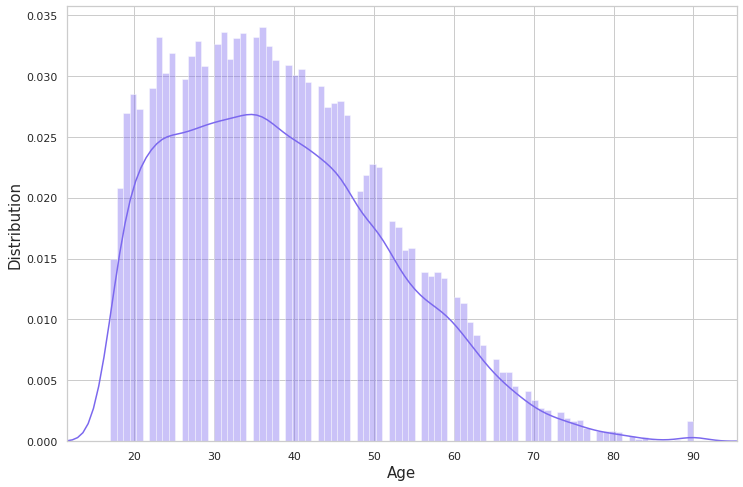

In [277]:
# This distribution plot shows the distribution of Age of people across the Data Set
plt.rcParams['figure.figsize'] = [12, 8]
sns.set(style = 'whitegrid')

sns.distplot(dataset['age'], bins = 90, color = 'mediumslateblue')
plt.ylabel("Distribution", fontsize = 15)
plt.xlabel("Age", fontsize = 15)
plt.margins(x = 0)

print ("The maximum age is", dataset['age'].max())
print ("The minimum age is", dataset['age'].min())

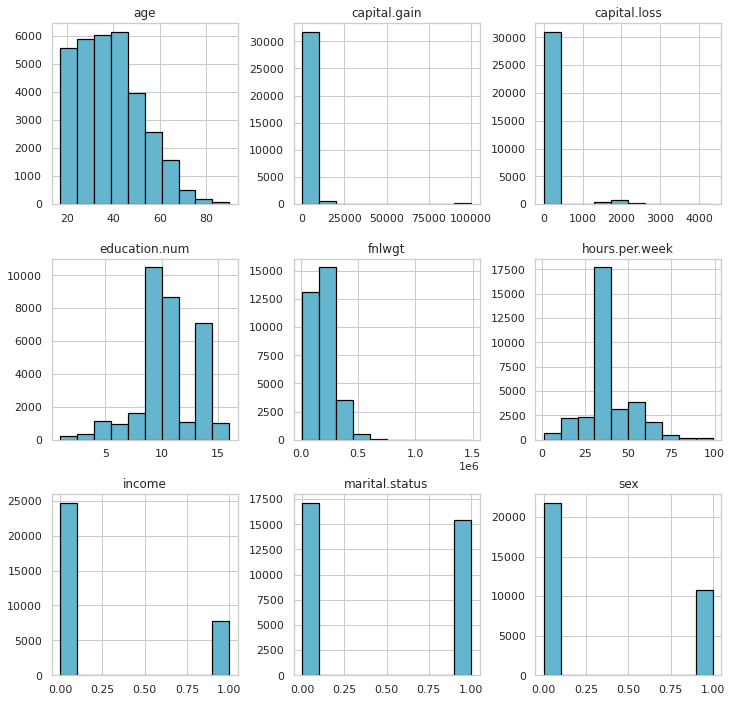

In [203]:
# Distribution of Different Features of the Dataset
distribution = dataset.hist(edgecolor = 'black', linewidth = 1.2, color = 'c')
fig = plt.gcf()
fig.set_size_inches(12,12)
plt.show()

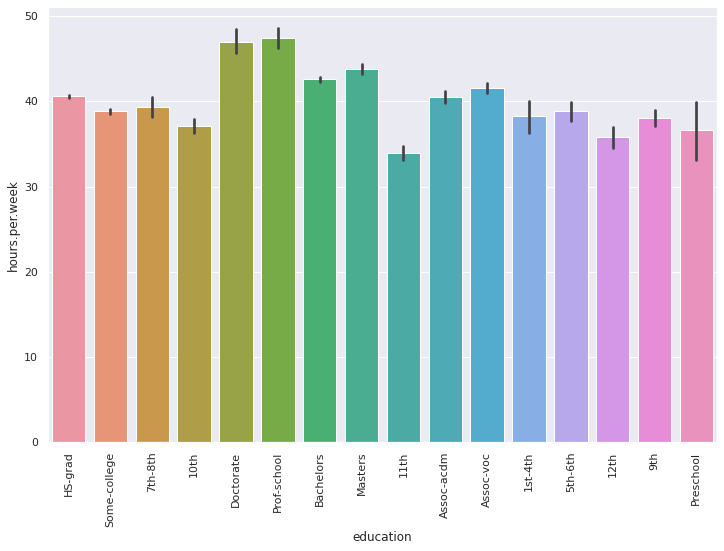

In [164]:
# This shows the hours per week according to the education of the person
sns.set(rc={'figure.figsize':(12,8)})
sns_grad = sns.barplot(x = dataset['education'], y = dataset['hours.per.week'], data = dataset)
plt.setp(sns_grad.get_xticklabels(), rotation=90);

**Model Building Phase**

In [0]:
X = dataset.drop(['income'], axis=1)
y = dataset['income']


In [0]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

**Decoding the Categorical Variables**

In [0]:
 from sklearn import preprocessing

categorical = ['workclass', 'education', 'marital.status', 'occupation', 'relationship', 'race', 'sex', 'native.country']
for feature in categorical:
        le = preprocessing.LabelEncoder()
        X_train[feature] = le.fit_transform(X_train[feature])
        X_test[feature] = le.transform(X_test[feature])

**Feature Scaling**

In [0]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train = pd.DataFrame(scaler.fit_transform(X_train), columns = X.columns)

X_test = pd.DataFrame(scaler.transform(X_test), columns = X.columns)

In [282]:
X_train.head()

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country
0,0.101484,2.600478,-1.494279,-0.332263,1.133894,1.051889,-0.782234,2.214196,0.39298,1.430470,-0.145189,-0.217407,-1.662414,0.262317
1,0.028248,-1.884720,0.438778,0.184396,-0.423425,1.051889,-0.026696,-0.899410,0.39298,-0.699071,-0.145189,-0.217407,-0.200753,0.262317
2,0.247956,-0.090641,0.045292,1.217715,-0.034095,-0.950671,-0.782234,-0.276689,0.39298,1.430470,-0.145189,-0.217407,-0.038346,0.262317
3,-0.850587,-1.884720,0.793152,0.184396,-0.423425,-0.950671,-0.530388,0.968753,0.39298,-0.699071,-0.145189,-0.217407,-0.038346,0.262317
4,-0.044989,-2.781760,-0.853275,0.442726,1.523223,1.051889,-0.782234,-0.899410,0.39298,-0.699071,-0.145189,-0.217407,-0.038346,0.262317


**Logistic Regression with Principal Component Analysis**

**Logistic Regression model with all features**

In [283]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

logreg = LogisticRegression()
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)

print('Logistic Regression accuracy score with all the features: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Logistic Regression accuracy score with all the features: 0.8386


**Logistic Regression with PCA**

Scikit-Learn's PCA class implements PCA algorithm using the code below. Before diving deep, I will explain another important concept called explained variance ratio.

In [211]:
from sklearn.decomposition import PCA
pca = PCA()
X_train = pca.fit_transform(X_train)
pca.explained_variance_ratio_

array([0.16807381, 0.10309589, 0.07993292, 0.0757857 , 0.07433186,
       0.07242905, 0.06977221, 0.06725093, 0.06428582, 0.06088258,
       0.05594367, 0.04284133, 0.03797117, 0.02740306])

**Comment**

We can see that approximately 97.25% of variance is explained by the first 13 variables.

Only 2.75% of variance is explained by the last variable. So, we can assume that it carries little information.

So, I will drop it, train the model again and calculate the accuracy.


**Logistic Regression with first 13 features**

In [213]:
X = dataset.drop(['income','native.country'], axis=1)
y = dataset['income']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)


categorical = ['workclass', 'education', 'marital.status', 'occupation', 'relationship', 'race', 'sex']
for feature in categorical:
        le = preprocessing.LabelEncoder()
        X_train[feature] = le.fit_transform(X_train[feature])
        X_test[feature] = le.transform(X_test[feature])


X_train = pd.DataFrame(scaler.fit_transform(X_train), columns = X.columns)

X_test = pd.DataFrame(scaler.transform(X_test), columns = X.columns)

logreg = LogisticRegression()
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)

print('Logistic Regression accuracy score with the first 13 features: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Logistic Regression accuracy score with the first 13 features: 0.8392


**Logistic Regression with first 12 features**

In [214]:
X = dataset.drop(['income','native.country', 'hours.per.week'], axis=1)
y = dataset['income']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)


categorical = ['workclass', 'education', 'marital.status', 'occupation', 'relationship', 'race', 'sex']
for feature in categorical:
        le = preprocessing.LabelEncoder()
        X_train[feature] = le.fit_transform(X_train[feature])
        X_test[feature] = le.transform(X_test[feature])


X_train = pd.DataFrame(scaler.fit_transform(X_train), columns = X.columns)

X_test = pd.DataFrame(scaler.transform(X_test), columns = X.columns)

logreg = LogisticRegression()
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)

print('Logistic Regression accuracy score with the first 12 features: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Logistic Regression accuracy score with the first 12 features: 0.8368


**Select right number of dimensions**

In [215]:
X = dataset.drop(['income'], axis=1)
y = dataset['income']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)


categorical = ['workclass', 'education', 'marital.status', 'occupation', 'relationship', 'race', 'sex', 'native.country']
for feature in categorical:
        le = preprocessing.LabelEncoder()
        X_train[feature] = le.fit_transform(X_train[feature])
        X_test[feature] = le.transform(X_test[feature])


X_train = pd.DataFrame(scaler.fit_transform(X_train), columns = X.columns)


pca= PCA()
pca.fit(X_train)
cumsum = np.cumsum(pca.explained_variance_ratio_)
dim = np.argmax(cumsum >= 0.90) + 1
print('The number of dimensions required to preserve 90% of variance is',dim)

The number of dimensions required to preserve 90% of variance is 12


**Comment**

With the required number of dimensions found, we can then set number of dimensions to dim and run PCA again.

With the number of dimensions set to dim, we can then calculate the required accuracy.

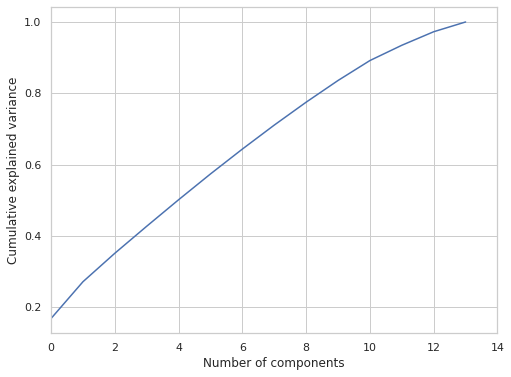

In [216]:
plt.figure(figsize=(8,6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlim(0,14,1)
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.show()

**Comment**

The above plot shows that almost 90% of variance is explained by the first 12 components.

**Plotting the Feature Importance Using the Boosted Gradient Descent**

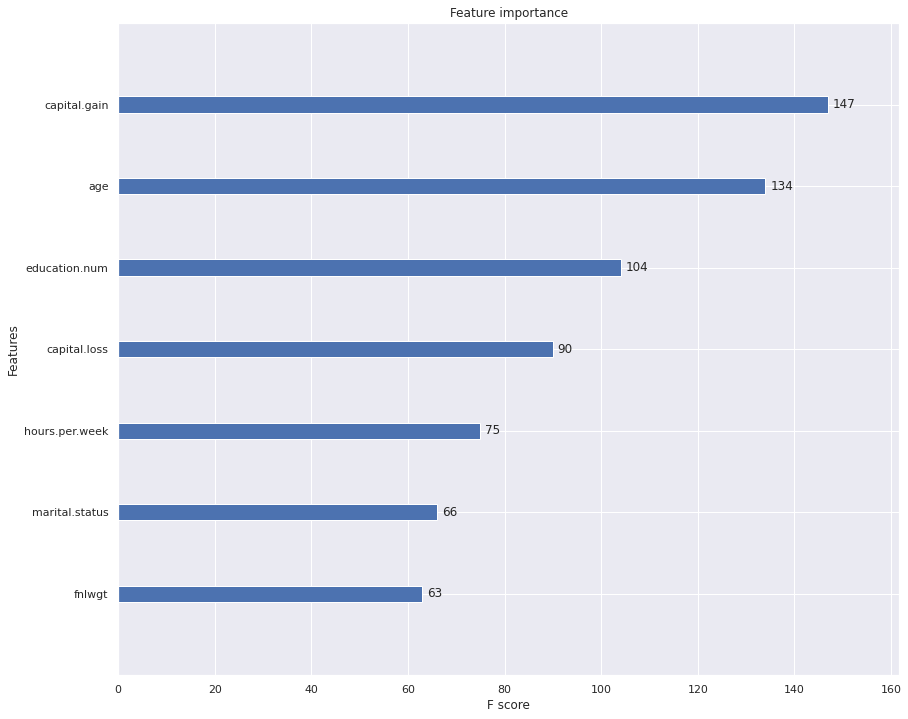

In [301]:
# Plotting the feature importances using the Boosted Gradient Descent
from xgboost import XGBClassifier
from xgboost import plot_importance

# Training the model
model = XGBClassifier()
model_importance = model.fit(X_train, y_train)

# Plotting the Feature importance bar graph
plt.rcParams['figure.figsize'] = [14,12]
sns.set(style = 'darkgrid')
plot_importance(model_importance);

**Trying out Other Models**

In [285]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier

from sklearn.model_selection import cross_val_score, StratifiedKFold, train_test_split, KFold
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score

from xgboost import XGBClassifier

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

print("Setup Complete")

Setup Complete


In [286]:
numeric_columns = ['marital.status','age','fnlwgt','education.num','capital.gain','capital.loss','hours.per.week']
X=dataset[numeric_columns]
Y=dataset.income
train_X, val_X, train_y, val_y = train_test_split(X,Y,test_size=0.21,random_state=0)

outcome = []
Modelnames = []
models = []
models.append(('Random Forest Classifier', RandomForestClassifier(n_estimators=50, max_features=4)))
models.append(('Linear Discriminant Analysis', LinearDiscriminantAnalysis()))
models.append(('Decision Tree Classifier', DecisionTreeClassifier()))
models.append(('Logistic Regression', LogisticRegression(solver='lbfgs')))

kfoldCV = StratifiedKFold(n_splits=5, random_state=0)
xgb_model = XGBClassifier(n_estimators=250)
results = cross_val_score(xgb_model, train_X, train_y, cv=kfoldCV)
print("XGBClassifier: %.2f%% (%.2f%%)" % (results.mean()*100, results.std()*100))
outcome.append(results)
Modelnames.append("XGBClassifier")

for name, model in models:
    kfoldCV = KFold(n_splits=5, random_state=0)
    cv_r = cross_val_score(model, train_X, train_y, cv=kfoldCV, scoring='accuracy')
    outcome.append(cv_r)
    Modelnames.append(name)
    print("%s: %.2f%% (%.2f%%)" % (name, cv_r.mean()*100, cv_r.std()*100))

XGBClassifier: 86.21% (0.50%)
Random Forest Classifier: 83.77% (0.36%)
Linear Discriminant Analysis: 83.10% (0.77%)
Decision Tree Classifier: 80.51% (0.57%)
Logistic Regression: 79.64% (0.66%)


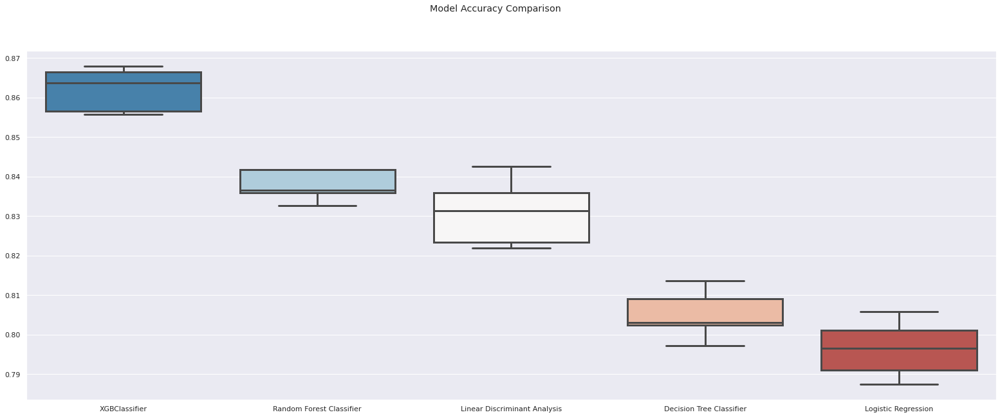

In [287]:
fig, axe = plt.subplots(figsize=(27,10))
data1 ={'Names': Modelnames,'Results': outcome}
fig.suptitle('Model Accuracy Comparison')
current_palette = sns.color_palette("RdBu_r", 5)
sns.set_context("poster")
sns.boxplot(x='Names',y='Results',data=data1,palette = current_palette)

In [288]:
eval_set=[(val_X,val_y)]
for i in [50,100,200,400,800,1600]:
    xgb_model = XGBClassifier(n_estimators=i,learning_rate=0.05).fit(train_X,train_y,early_stopping_rounds=i-i*.75,eval_set=eval_set, verbose=False)
    results = xgb_model.predict(val_X)
    predictions = [round(value) for value in results]
    accuracy = accuracy_score(val_y, predictions)
    print("Accuracy: %.2f%% --- %.2f N_estimators" % (accuracy * 100.0,i))

Accuracy: 84.24% --- 50.00 N_estimators
Accuracy: 84.98% --- 100.00 N_estimators
Accuracy: 85.58% --- 200.00 N_estimators
Accuracy: 85.87% --- 400.00 N_estimators
Accuracy: 86.02% --- 800.00 N_estimators
Accuracy: 86.02% --- 1600.00 N_estimators


In [289]:
xgb_model = XGBClassifier(n_estimators=1600,learning_rate=0.05).fit(train_X,train_y,early_stopping_rounds=i-i*.75,eval_set=eval_set, verbose=False)
results = xgb_model.predict(val_X)
print("Accuracy: %s%%" % (100*accuracy_score(val_y, results)))
print(classification_report(val_y, results))

Accuracy: 86.01930389002632%
              precision    recall  f1-score   support

           0       0.88      0.95      0.91      5207
           1       0.77      0.58      0.67      1631

    accuracy                           0.86      6838
   macro avg       0.83      0.77      0.79      6838
weighted avg       0.85      0.86      0.85      6838



**Trying various Classifiers Individually**

In [0]:
# Importing the required libraries
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.svm import SVC
import warnings; warnings.simplefilter('ignore')

In [0]:
numeric_columns = ['marital.status','age','fnlwgt','education.num','capital.gain','capital.loss','hours.per.week']
X=dataset[numeric_columns]
Y=dataset.income

In [0]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

In [299]:
# Training Logistic Regression

logistic = LogisticRegression(C = 0.5, max_iter = 500)
model_1 = logistic.fit(X_train, y_train)

# Predictions
pred_1 = model_1.predict(X_test)

print ("The accuracy of model 1 : ",accuracy_score(y_test, pred_1))
print ("The f1 score of model 1 : ", f1_score(y_test, pred_1, average = 'binary'))

The accuracy of model 1 :  0.7976251407513564
The f1 score of model 1 :  0.39113027409916845


In [302]:
# Training Random Forest Classifier 
R_forest = RandomForestClassifier(n_estimators = 200)
model_2 = R_forest.fit(X_train, y_train)

# Predictions
pred_2 = model_2.predict(X_test)

print ("The accuracy of model 2 : ",accuracy_score(y_test, pred_2))
print ("The f1 score of model 2 : ", f1_score(y_test, pred_2, average = 'binary'))

The accuracy of model 2 :  0.8383662606203296
The f1 score of model 2 :  0.641217905021586


In [296]:
# Training the XGB Classifier

boosted_gd = XGBClassifier(learning_rate = 0.35, n_estimator = 200)
model_3 = boosted_gd.fit(X_train, y_train)

# Predictions
pred_3 = model_3.predict(X_test)

print ("The accuracy of model 3 : ",accuracy_score(y_test, pred_3))
print ("The f1 score of model 3 : ", f1_score(y_test, pred_3, average = 'binary'))

The accuracy of model 3 :  0.8570989865902344
The f1 score of model 3 :  0.6652278177458033


In [303]:
# Training the Bernoulli Classifier

NB = BernoulliNB(alpha = 0.3)
model_4 = NB.fit(X_train, y_train)

# Predictions
pred_4 = model_4.predict(X_test)

print ("The accuracy of model 4 : ",accuracy_score(y_test, pred_4))
print ("The f1 score of model 4 : ", f1_score(y_test, pred_4, average = 'binary'))

The accuracy of model 4 :  0.7982393284880746
The f1 score of model 4 :  0.3834845167344385


In [304]:
# Traininng Support Vector Machine 
svc = SVC(kernel = 'rbf', max_iter = 1000, probability = True)
model_5 = svc.fit(X_train, y_train)

# Predictions
pred_5 = model_5.predict(X_test)

print ("The accuracy of model 5 : ",accuracy_score(y_test, pred_5))
print ("The f1 score of model 5 : ", f1_score(y_test, pred_5, average = 'binary'))

The accuracy of model 5 :  0.7070324495854233
The f1 score of model 5 :  0.148720999405116


In [305]:
list_pred = [pred_1, pred_2, pred_3, pred_4, pred_5]
model_names = ["Logistic Regression", "Random Forest Classifier", "Boosted Gradient Descent", "Bernoulli NB", "SVC"]

for i, predictions in enumerate(list_pred) :
    print ("Classification Report of ", model_names[i])
    print ()
    print (classification_report(y_test, predictions, target_names = ["<=50K", ">50K"]))

Classification Report of  Logistic Regression

              precision    recall  f1-score   support

       <=50K       0.81      0.97      0.88      7410
        >50K       0.72      0.27      0.39      2359

    accuracy                           0.80      9769
   macro avg       0.76      0.62      0.63      9769
weighted avg       0.78      0.80      0.76      9769

Classification Report of  Random Forest Classifier

              precision    recall  f1-score   support

       <=50K       0.88      0.91      0.90      7410
        >50K       0.69      0.60      0.64      2359

    accuracy                           0.84      9769
   macro avg       0.78      0.76      0.77      9769
weighted avg       0.83      0.84      0.83      9769

Classification Report of  Boosted Gradient Descent

              precision    recall  f1-score   support

       <=50K       0.88      0.94      0.91      7410
        >50K       0.77      0.59      0.67      2359

    accuracy                   

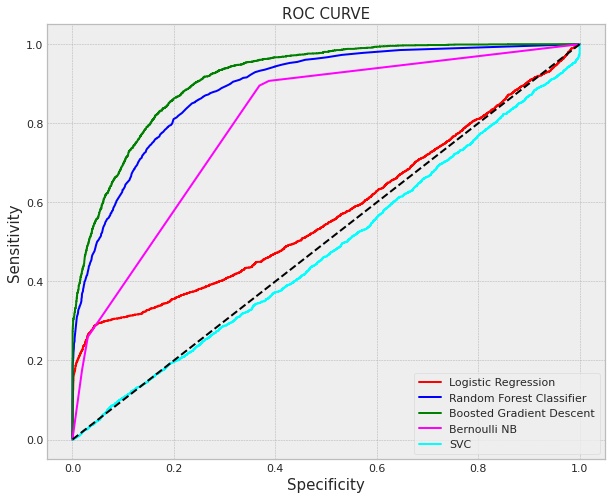

In [306]:
# ROC Curve for the classification models

from sklearn.metrics import roc_auc_score, roc_curve
models = [model_1, model_2, model_3, model_4, model_5]

# Setting the parameters for the ROC Curve
plt.rcParams['figure.figsize'] = [10,8]
plt.style.use("bmh")

color = ['red', 'blue', 'green', 'fuchsia', 'cyan']
plt.title("ROC CURVE", fontsize = 15)
plt.xlabel("Specificity", fontsize = 15)
plt.ylabel("Sensitivity", fontsize = 15)
i = 1

for i, model in enumerate(models) :
    prob = model.predict_proba(X_test)
    prob_positive = prob[:,1]
    fpr, tpr, threshold = roc_curve(y_test, prob_positive)
    plt.plot(fpr, tpr, color = color[i])
    plt.gca().legend(model_names, loc = 'lower right', frameon = True)

plt.plot([0,1],[0,1], linestyle = '--', color = 'black')
plt.show()

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn import datasets
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import tree
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import train_test_split
%matplotlib inline


In [308]:
from sklearn.neighbors import KNeighborsClassifier
k_range = np.arange(1, 26)
scores = []
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    scores.append(metrics.accuracy_score(y_test, y_pred))
print(scores.index(max(scores)), max(scores))

24 0.8003889855665882


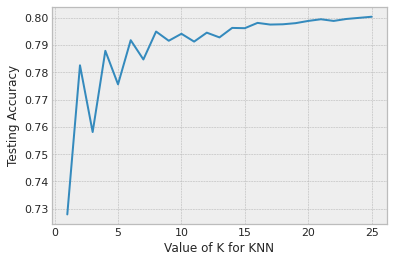

In [309]:
# plot the relationship between K and testing accuracy
plt.plot(k_range, scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Testing Accuracy')
plt.grid(True)

In [310]:
clf = tree.DecisionTreeClassifier()
clf = clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
metrics.accuracy_score(y_test, y_pred)

0.8085781553894974

**Interpretable Machine Learning**

**Setup Installation**

In [0]:
!pip install shap

In [0]:
! pip install eli5

In [0]:
! pip install pdpbox

In [0]:
! pip install lime

In [316]:
import os
import xgboost as xgb
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import GridSearchCV, KFold
import shap
import eli5
from tqdm import tqdm
from pdpbox import pdp
from lime import lime_tabular
from sklearn.preprocessing import KBinsDiscretizer

%matplotlib inline

Using TensorFlow backend.


In [318]:
# model explainers
import lime
from lime.lime_tabular import LimeTabularExplainer
import eli5
from eli5.sklearn import PermutationImportance
import shap
from shap import TreeExplainer,KernelExplainer,LinearExplainer
shap.initjs()

**Model Interpetability**

Partial Dependence Plots

SHAP Values

Advanced Uses of SHAP Values

SHAP Summary Plots

LIME

In [0]:
# Training and fitting a Random Forest Model
my_model = RandomForestClassifier(n_estimators=100,
                                  random_state=0).fit(X_train, y_train)

In [0]:
# Calculating and Displaying importance using the eli5 library
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(my_model, random_state=1).fit(X_test,y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.0486 ± 0.0023,capital.gain
0.0195 ± 0.0025,education.num
0.0148 ± 0.0066,relationship
0.0127 ± 0.0031,age
0.0119 ± 0.0025,capital.loss
0.0081 ± 0.0038,occupation
0.0041 ± 0.0026,marital.status
0.0037 ± 0.0023,workclass
0.0012 ± 0.0015,race
0.0002 ± 0.0019,sex


Interpretation

The features at the top are most important and at the bottom, the least.

 For this example, 'Capitalgain' is the most important feature which decides whether a person will have diabetes, which also makes sense.

The number after the ± measures how performance varied from one-reshuffling to the next.

Some weights are negative. This is because in those cases predictions on the shuffled data were found to be more accurate than the real data.

**Partial Dependence Plots**

The partial dependence plot (short PDP or PD plot) shows the marginal effect one or two features have on the predicted outcome of a machine learning model( J. H. Friedman 2001). PDPs show how a feature affects predictions. PDP can show the relationship between the target and the selected features via 1D or 2D plots.

In [0]:
# training and fitting a Decision Tree
from sklearn.tree import DecisionTreeClassifier
feature_names = [i for i in dataset.columns]
tree_model = DecisionTreeClassifier(random_state=0).fit(X_train, y_train)

In [0]:
feature_names = ['marital.status','age','fnlwgt','education.num','capital.gain','capital.loss','hours.per.week']

In [361]:
# Let's plot a decision tree source
# Since there are a lot of attributes, it is difficult to actually make sense of the decision tree graph in this notebook. 
# It is advised to export it as png and view it.

from sklearn import tree
import graphviz

tree_graph = tree.export_graphviz(tree_model, out_file=None, feature_names=feature_names,filled = True)
graphviz.Source(tree_graph)

The library to be used for plotting PDPs is called python partial dependence plot toolbox or simply [PDPbox]. PDPs are also calculated after a model has been fit. In our dataset there are a lot of features like Glucose, BLood Pressure, Age etc. We start by considering a single row.

We proceed by fitting our model and calculating the probability of a person having diabetes which is our target variable. Next, we would choose a variable and continuously alter its value. For instance, we will calculate the outcome if the person's insulin level is 50,100,150 and so on. All these values are then plotted and we get a graph of predicted vs actual

In [0]:
from matplotlib import pyplot as plt
from pdpbox import pdp, get_dataset, info_plots

# Create the data that we will plot
pdp_goals = pdp.pdp_isolate(model=tree_model, dataset=X_test, model_features=feature_names, feature='age')

In [0]:
from pdpbox import pdp, get_dataset, info_plots

# Create the data that we will plot
pdp_goals = pdp.pdp_isolate(model=tree_model, dataset=X_test, model_features=feature_names, feature='age')

# plot it
pdp.pdp_plot(pdp_goals, 'age')
plt.show()

KeyError: ignored

In [0]:
# Build Random Forest model
rf_model = RandomForestClassifier(random_state=0).fit(X_train, y_train)

pdp_dist = pdp.pdp_isolate(model=rf_model, dataset=dataset, model_features=feature_names, feature=feature_to_plot)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

ValueError: ignored

**SHAP Values**

SHAP which stands for SHapley Additive exPlanation, helps to break down a prediction to show the impact of each feature. It is based on Shapley values, a technique used in game theory to determine how much each player in a collaborative game has contributed to its success¹. Normally, getting the trade-off between accuracy and interpretability just right can be a difficult balancing act but SHAP values can deliver both.

SHAP values interpret the impact of having a certain value for a given feature in comparison to the prediction we’d make if that feature took some baseline value.

Shap values show how much a given feature changed our prediction (compared to if we made that prediction at some baseline value of that feature). Let’s say we wanted to know what was the prediction when the insulin level was 150 instead of some fixed baseline no. If we are able to answer this, we could perform the same steps for other features as follows:

In [0]:
row_to_show = 10
data_for_prediction = X_test.iloc[row_to_show]  # use 1 row of data here. Could use multiple rows if desired
data_for_prediction_array = data_for_prediction.values.reshape(1, -1)

tree_model.predict_proba(data_for_prediction_array)

array([[1., 0.]])

SHAP values are calculated using the Shap library which can be installed easily from PyPI or conda. SHAP values interpret the impact of having a certain value for a given feature in comparison to the prediction we’d make if that feature took some baseline value.

In [0]:
import shap  # package used to calculate Shap values

# Create object that can calculate shap values
explainer = shap.TreeExplainer(tree_model)

# Calculate Shap values
shap_values = explainer.shap_values(data_for_prediction)

In [0]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], data_for_prediction)

**Interpretation**

The above explanation shows features each contributing to push the model output from the base value (the average model output over the training dataset we passed) to the model output. Features pushing the prediction higher are shown in red, those pushing the prediction lower are in blue

The base_value here is 0.3576 while our predicted value is 1.
education num = 2.37 has the biggest impact on increasing the prediction, while
fnlwight feature has the biggest effect in decreasing the prediction.

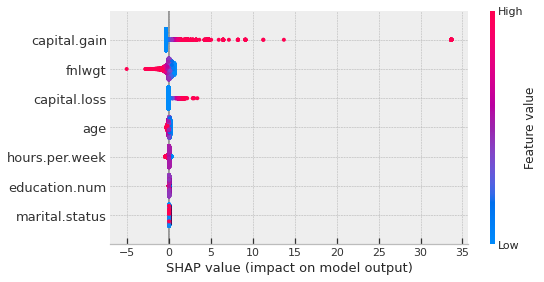

In [344]:
shap_values = explainer.shap_values(X_test.values)
spplot = shap.summary_plot(shap_values, X_test.values, feature_names=X_test.columns)

For the global model interpretation, we can notice that capital tgm and fnlwgt are the two most contributing features.

**4. Advanced Uses of SHAP Values**

Aggregating many SHAP values can provide even more detailed insights into the model.

**SHAP Summary Plots**

To get an overview of which features are most important for a model we can plot the SHAP values of every feature for every sample. The summary plot tells which features are most important, and also their range of effects over the dataset.

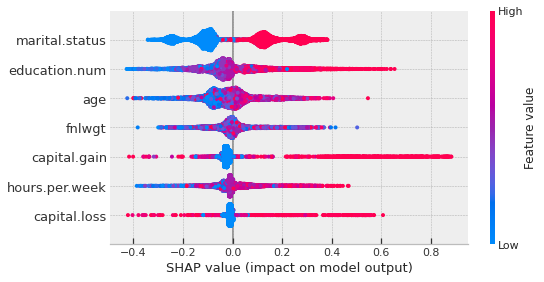

In [338]:
import shap  # package used to calculate Shap values

# Create object that can calculate shap values
explainer = shap.TreeExplainer(tree_model)

# calculate shap values. This is what we will plot.
# Calculate shap_values for all of val_X rather than a single row, to have more data for plot.
shap_values = explainer.shap_values(X_test)

# Make plot. Index of [1] is explained in text below.
shap.summary_plot(shap_values[1],X_test)

In [0]:
import shap  # package used to calculate Shap values

# Create object that can calculate shap values
explainer = shap.TreeExplainer(tree_model)
# Calculate Shap values
shap_values = explainer.shap_values(X_train)
shap.initjs()

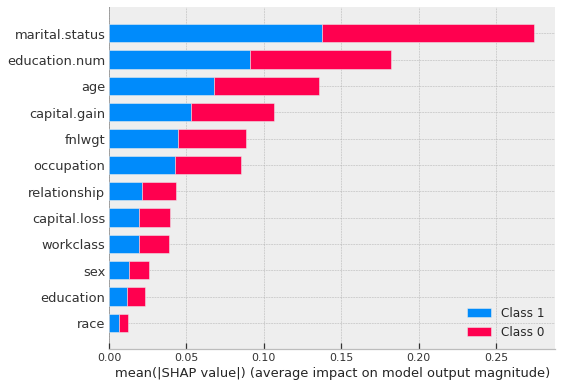

In [0]:
shap.summary_plot(shap_values, X_train)

**For every dot:**

Vertical location shows what feature it is depicting
Color shows whether that feature was high or low for that row of the dataset
Horizontal location shows whether the effect of that value caused a higher or lower prediction.
The point in the upper left was depicts a person whose glucose level is less thereby reducing the prediction of diabetes by 0.4.

**5. LIME: Locally Interpretable Model-Agnostic Explanations**

The framework LIME is introduced in a paper titled: "Why Should I Trust You?

": Explaining the Predictions of Any Classifier. This paper talks about an algorithm that is capable of explaining the predicitons of a ML model(classification/Regression problem) in a reasonable way.LIME essentially approximates the predictions of the blackbox models locally with an intrepretable model.


In [0]:
import lime
from lime.lime_tabular import LimeTabularExplainer

The LIME explainer is a Local Model Interpreter which include the feature importance for a particular prediction.
This is helpful if you want to findout why the model predicted this way in a particular patient.

In [0]:
#initialization of a explainer from LIME
explainer = LimeTabularExplainer(X_train.values,
                                 mode='classification',
                                 feature_names=X_train.columns,
                                 class_names=['<=50K','>=50K'])

In [0]:
# training and fitting a Decision Tree

from sklearn.tree import DecisionTreeClassifier
feature_names = [i for i in dataset.columns]
tree_model = DecisionTreeClassifier(random_state=0).fit(X_train, y_train)

**Decision Tree**

In [326]:
exp = explainer.explain_instance(X_test.values[0],
                                 tree_model.predict_proba,
                                 num_features=X_train.shape[1])
exp.show_in_notebook(show_table=True)

**Logistic Regression**

In [0]:
exp = explainer.explain_instance(X_test.values[0],
                                 logreg.predict_proba,
                                 num_features=X_train.shape[1])
exp.show_in_notebook(show_table=True)

**Experimenting Various Complex Models**

In [327]:
%%time
ML_models = {}
model_index = ['LR','RF','NN']
model_sklearn = [LogisticRegression(solver='liblinear',random_state=0),
                 RandomForestClassifier(n_estimators=100,random_state=0),
                 MLPClassifier([100]*5,early_stopping=True,learning_rate='adaptive',random_state=0)]
model_summary = []
for name,model in zip(model_index,model_sklearn):
    ML_models[name] = model.fit(X_train,y_train)
    preds = model.predict(X_test)
    model_summary.append([name,f1_score(y_test,preds,average='weighted'),accuracy_score(y_test,preds),
                          roc_auc_score(y_test,model.predict_proba(X_test)[:,1])])
print(ML_models)

{'LR': LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=0, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False), 'RF': RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=0, verbose=0,
                       warm_start=False), 'NN': MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, ea

In [328]:
model_summary = pd.DataFrame(model_summary,columns=['Name','F1_score','Accuracy','AUC_ROC'])
model_summary = model_summary.reset_index()
display(model_summary)

,index,Name,F1_score,Accuracy,AUC_ROC
0,0,LR,0.761083,0.797830,0.575480
1,1,RF,0.832625,0.837138,0.886293
2,2,NN,0.769741,0.802641,0.638300


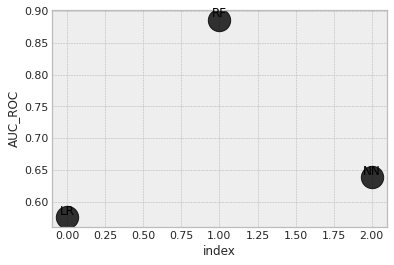

In [329]:
g=sns.regplot(data=model_summary, x="index", y="AUC_ROC", fit_reg=False,
               marker="o", color="black", scatter_kws={'s':500})

for i in range(0,model_summary.shape[0]):
     g.text(model_summary.loc[i,'index'], model_summary.loc[i,'AUC_ROC']+0.02, model_summary.loc[i,'Name'], 
            horizontalalignment='center',verticalalignment='top', size='large', color='black')

**The Complex Models**

**LIME - Neural Network**

In [330]:
exp = explainer.explain_instance(X_test.values[0],
                                 ML_models['NN'].predict_proba,
                                 num_features=X_train.shape[1])
exp.show_in_notebook(show_table=True)

**LIME - Random Forest**

In [331]:
# Training the Random Forest Classifier
R_forest = RandomForestClassifier(n_estimators = 200)
model_2 = R_forest.fit(X_train, y_train)

# Predictions
pred_2 = model_2.predict(X_test)

print ("The accuracy of model 2 : ",accuracy_score(y_test, pred_2))
print ("The f1 score of model 2 : ", f1_score(y_test, pred_2, average = 'binary'))

The accuracy of model 2 :  0.8383662606203296
The f1 score of model 2 :  0.6400729427855028


In [332]:
exp = explainer.explain_instance(X_test.values[0],
                                 model_2.predict_proba,
                                 num_features=X_train.shape[1])
exp.show_in_notebook(show_table=True)

In [0]:
#Random Forest Classifier from the Complex Models

exp = explainer.explain_instance(X_test.values[0],
                                 ML_models['RF'].predict_proba,
                                 num_features=X_train.shape[1])
exp.show_in_notebook(show_table=True)

**using the ELI5 library**

**ELI5 - Random Forest Classifier**

Global model interpretation

Local model interpretation

Permutation Importance from Testing Data

In [333]:
# Training the Random Forest Classifier

R_forest = RandomForestClassifier(n_estimators = 200)
model_2 = R_forest.fit(X_train, y_train)

# Predictions
pred_2 = model_2.predict(X_test)

print ("The accuracy of model 2 : ",accuracy_score(y_test, pred_2))
print ("The f1 score of model 2 : ", f1_score(y_test, pred_2, average = 'binary'))

The accuracy of model 2 :  0.8374449790152523
The f1 score of model 2 :  0.6387625113739764


For the **global model interpretation**, we can notice that fnlwgt and age are the two most positive contributing features.


In [334]:
eli5.show_weights(model_2,feature_names=list(X_test.columns),top=None)

Weight,Feature
0.2925 ± 0.0173,fnlwgt
0.1718 ± 0.0467,age
0.1485 ± 0.0654,marital.status
0.1281 ± 0.0341,education.num
0.1239 ± 0.0473,capital.gain
0.0931 ± 0.0262,hours.per.week
0.0421 ± 0.0165,capital.loss


For the **Local Model Interpretation**, we can notice that marital status and relationship are the two most positive contributing features. While, the number_inpatient and age are the two most negative contributing features

In [335]:
eli5.show_prediction(model_2, X_test.values[0],feature_names=list(X_test.columns),top=None)

For the **Permutation Importance**, we can notice that capital_gain and education_num are the two most positive contributing features

In [337]:
exp = PermutationImportance(model_2,
                            random_state = 0).fit(X_test, y_test)
eli5.show_weights(exp,feature_names=list(X_test.columns),top=None)

Weight,Feature
0.0488 ± 0.0050,marital.status
0.0487 ± 0.0020,capital.gain
0.0369 ± 0.0058,education.num
0.0120 ± 0.0013,capital.loss
0.0113 ± 0.0062,age
0.0017 ± 0.0035,hours.per.week
0.0008 ± 0.0049,fnlwgt


In [0]:
# Training and fitting a Random Forest Model
my_model = RandomForestClassifier(n_estimators=100,
                                  random_state=0).fit(X_train, y_train)

In [356]:
# Calculating and Displaying importance using the eli5 library
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(my_model, random_state=1).fit(X_test,y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.0499 ± 0.0016,marital.status
0.0475 ± 0.0024,capital.gain
0.0350 ± 0.0054,education.num
0.0116 ± 0.0038,age
0.0111 ± 0.0010,capital.loss
0.0039 ± 0.0046,hours.per.week
0.0012 ± 0.0036,fnlwgt


**Interpretation**

The features at the top are most important and at the bottom, the least. For this example, 'Glucose level' is the most important feature which decides whether a person will have diabetes, which also makes sense.
The number after the ± measures how performance varied from one-reshuffling to the next.

Some weights are negative. This is because in those cases predictions on the shuffled data were found to be more accurate than the real data

In [0]:
# data pre processing
import numpy as np
import pandas as pd

# data visuzlization
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn')

# warnings
import warnings
warnings.filterwarnings('ignore')

# modeling
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score,accuracy_score,roc_auc_score
